## 🧠 Hybrid Customer Churn Prediction Model
Combines Gradient Boosting and LSTM

## 📊 Data Preprocessing

In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Load the dataset
df = pd.read_csv("Telco_customer_churn.csv")

# Drop irrelevant columns
df_clean = df.drop(columns=['CustomerID', 'Lat Long', 'Churn Label', 'Churn Reason', 'Country', 'State', 'City'])

# Clean 'Total Charges' column and convert to float
df_clean['Total Charges'] = pd.to_numeric(df_clean['Total Charges'], errors='coerce')
df_clean.dropna(inplace=True)

# Encode categorical features
for col in df_clean.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df_clean[col] = le.fit_transform(df_clean[col])

# Split features and target
X = df_clean.drop(columns='Churn Value')
y = df_clean['Churn Value']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Normalize data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


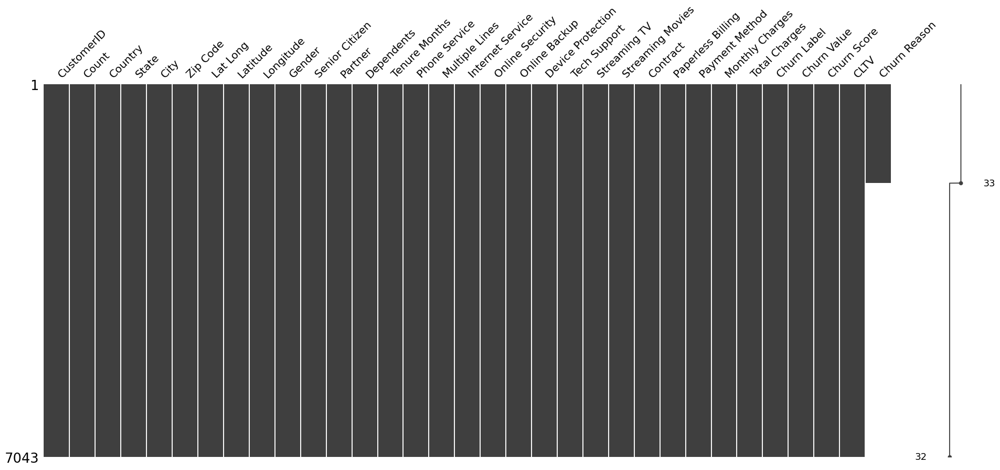

In [4]:
import missingno as msno

msno.matrix(df)
plt.show()


In [6]:
print(df.columns.tolist())


['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code', 'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen', 'Partner', 'Dependents', 'Tenure Months', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Online Security', 'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method', 'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value', 'Churn Score', 'CLTV', 'Churn Reason']


In [9]:

# 🧾 YData Profiling Report
from ydata_profiling import ProfileReport

profile = ProfileReport(df_clean, title="Telco Customer Churn Profiling Report", explorative=True)
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 66.98it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 📊 Exploratory Data Analysis

In [11]:
print(df.columns)


Index(['CustomerID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')


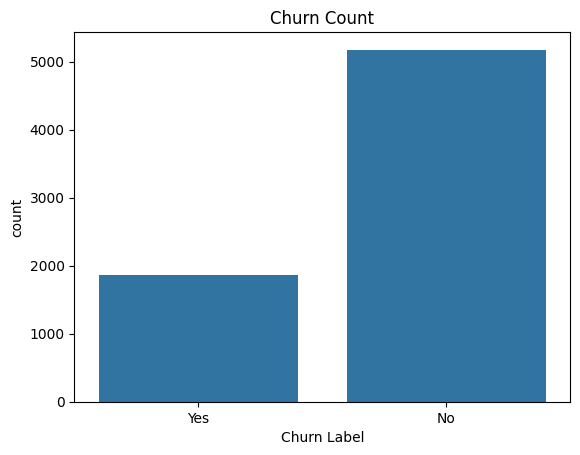

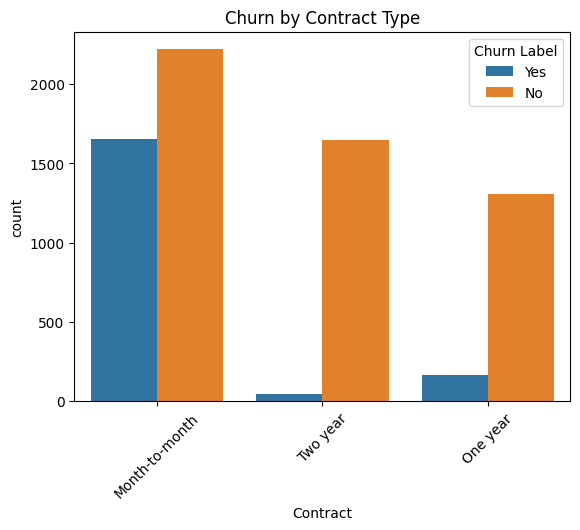

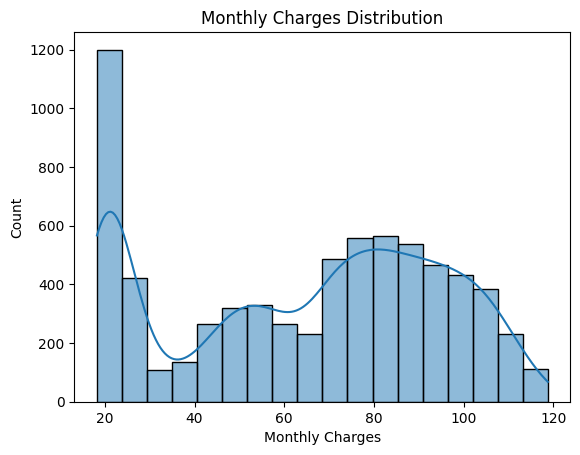

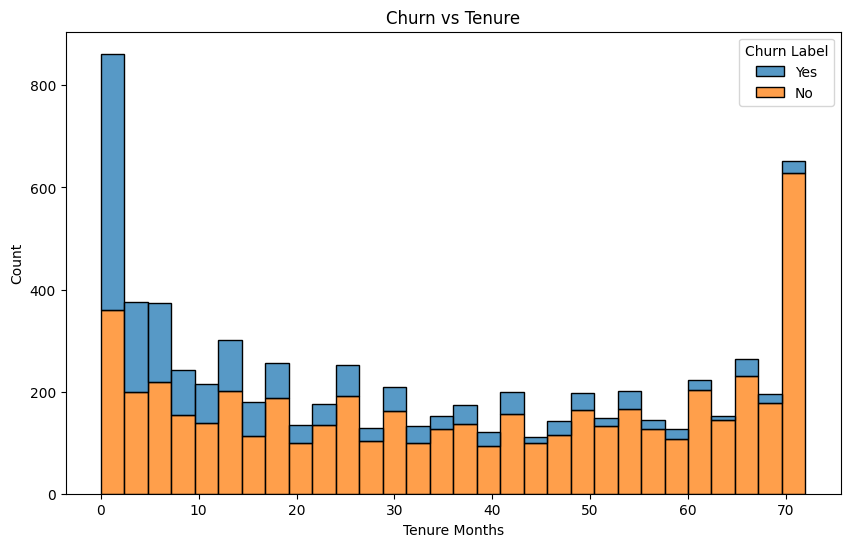

In [13]:

import matplotlib.pyplot as plt
import seaborn as sns

# Distribution of Churn
sns.countplot(x='Churn Label', data=df)
plt.title('Churn Count')
plt.show()


# Churn by Contract Type
sns.countplot(x='Contract', hue='Churn Label', data=df)
plt.title('Churn by Contract Type')
plt.xticks(rotation=45)
plt.show()

# Monthly Charges Distribution
sns.histplot(df['Monthly Charges'], kde=True)
plt.title('Monthly Charges Distribution')
plt.show()

# Tenure vs Churn
plt.figure(figsize=(10,6))
sns.histplot(data=df, x='Tenure Months', hue='Churn Label', multiple="stack", bins=30)
plt.title('Churn vs Tenure')
plt.show()


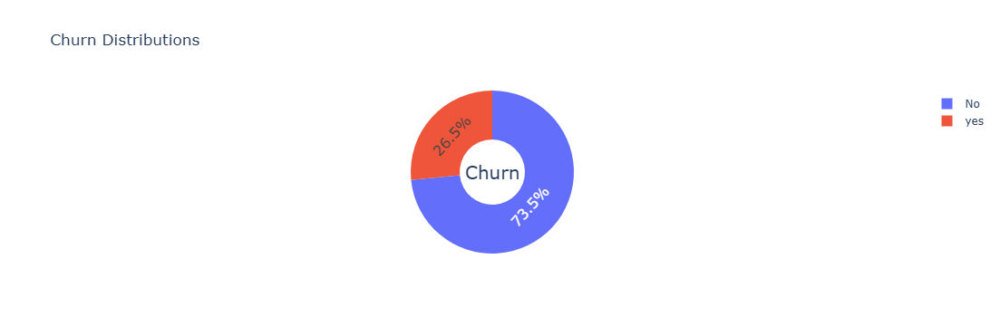

In [15]:
type_ = ["No", "yes"]
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Pie(labels=type_, values=df['Churn Label'].value_counts(), name="Churn"))


# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Churn', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [17]:
# data[data['Churn Label'] == "No"].groupby('Gender').size()
df.columns = df.columns.str.strip().str.replace(' ', '_').str.lower()
df[df['churn_label'] == "No"].groupby('gender').size()



gender
Female    2549
Male      2625
dtype: int64

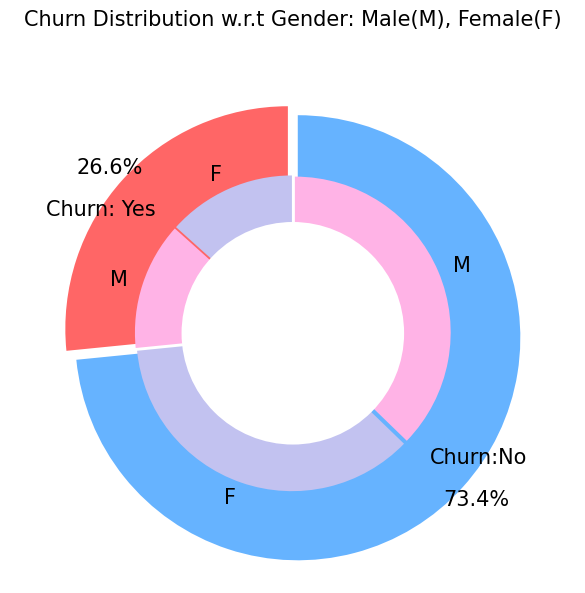

In [19]:
plt.figure(figsize=(6, 6))
labels =["Churn: Yes","Churn:No"]
values = [1869,5163]
labels_gender = ["F","M","F","M"]
sizes_gender = [939,930 , 2544,2619]
colors = ['#ff6666', '#66b3ff']
colors_gender = ['#c2c2f0','#ffb3e6', '#c2c2f0','#ffb3e6']
explode = (0.3,0.3)
explode_gender = (0.1,0.1,0.1,0.1)
textprops = {"fontsize":15}
#Plot
plt.pie(values, labels=labels,autopct='%1.1f%%',pctdistance=1.08, labeldistance=0.8,colors=colors, startangle=90,frame=True, explode=explode,radius=10, textprops =textprops, counterclock = True, )
plt.pie(sizes_gender,labels=labels_gender,colors=colors_gender,startangle=90, explode=explode_gender,radius=7, textprops =textprops, counterclock = True, )
#Draw circle
centre_circle = plt.Circle((0,0),5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title('Churn Distribution w.r.t Gender: Male(M), Female(F)', fontsize=15, y=1.1)

# show plot

plt.axis('equal')
plt.tight_layout()
plt.show()

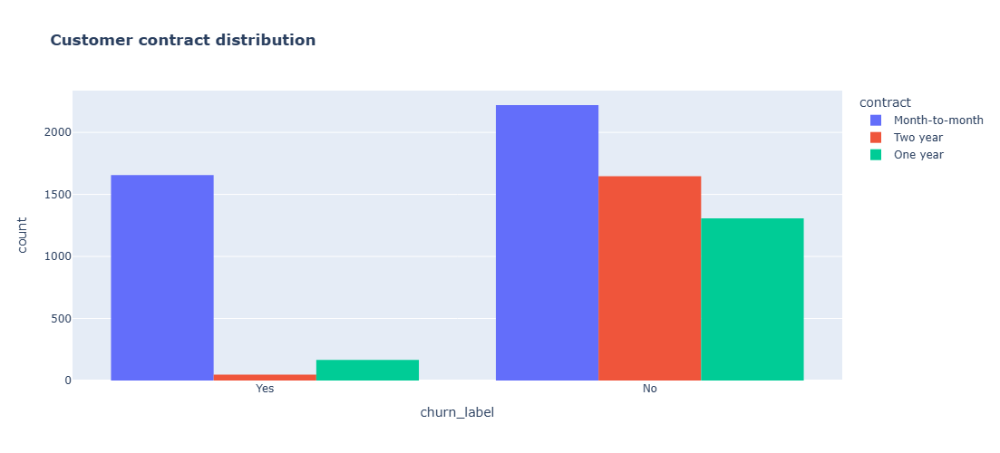

In [21]:
fig = px.histogram(df, x="churn_label", color="contract", barmode="group", title="<b>Customer contract distribution</b>")

fig.update_layout(width=700, height=500, bargap=0.2)
fig.show()

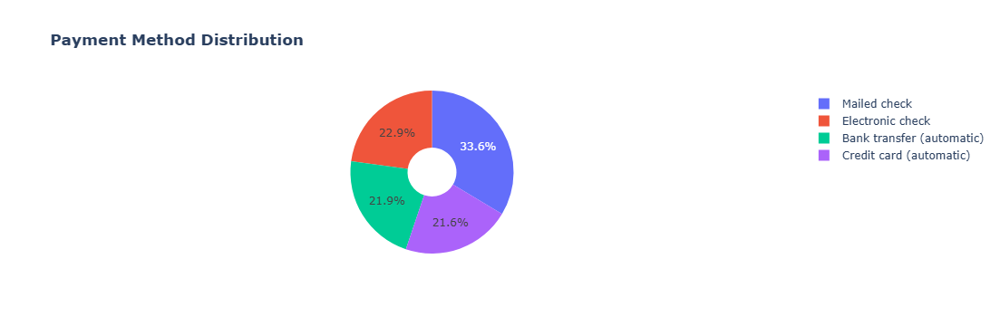

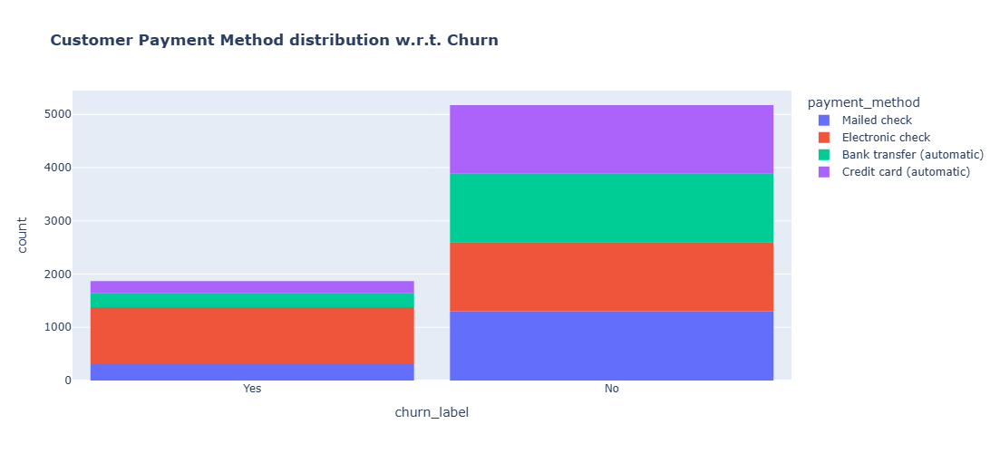

In [23]:
# Pie chart for Payment Method distribution
labels = df['payment_method'].unique()
values = df['payment_method'].value_counts()

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])
fig.update_layout(title_text="<b>Payment Method Distribution</b>")
fig.show()

# Histogram of Payment Method w.r.t. Churn
fig = px.histogram(df, x="churn_label", color="payment_method", title="<b>Customer Payment Method distribution w.r.t. Churn</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()


In [25]:
 df[df["gender"]=="Male"][["internet_service", "churn_label"]
].value_counts()


internet_service  churn_label
DSL               No             993
Fiber optic       No             910
No                No             722
Fiber optic       Yes            633
DSL               Yes            240
No                Yes             57
Name: count, dtype: int64

In [27]:
# For Female
df[df["gender"] == "Female"][["internet_service", "churn_label"]].value_counts()


internet_service  churn_label
DSL               No             969
Fiber optic       No             889
No                No             691
Fiber optic       Yes            664
DSL               Yes            219
No                Yes             56
Name: count, dtype: int64

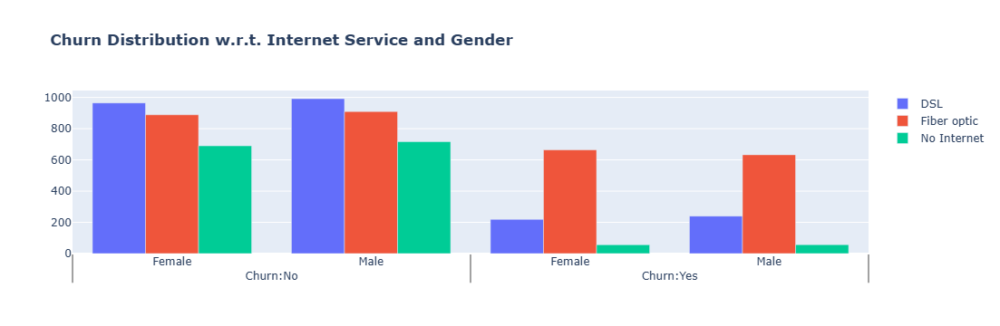

In [29]:

fig = go.Figure()

fig.add_trace(go.Bar(
  x = [['Churn:No', 'Churn:No', 'Churn:Yes', 'Churn:Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [965, 992, 219, 240],
  name = 'DSL',
))

fig.add_trace(go.Bar(
  x = [['Churn:No', 'Churn:No', 'Churn:Yes', 'Churn:Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [889, 910, 664, 633],
  name = 'Fiber optic',
))

fig.add_trace(go.Bar(
  x = [['Churn:No', 'Churn:No', 'Churn:Yes', 'Churn:Yes'],
       ["Female", "Male", "Female", "Male"]],
  y = [690, 717, 56, 57],
  name = 'No Internet',
))

fig.update_layout(title_text="<b>Churn Distribution w.r.t. Internet Service and Gender</b>")

fig.show()

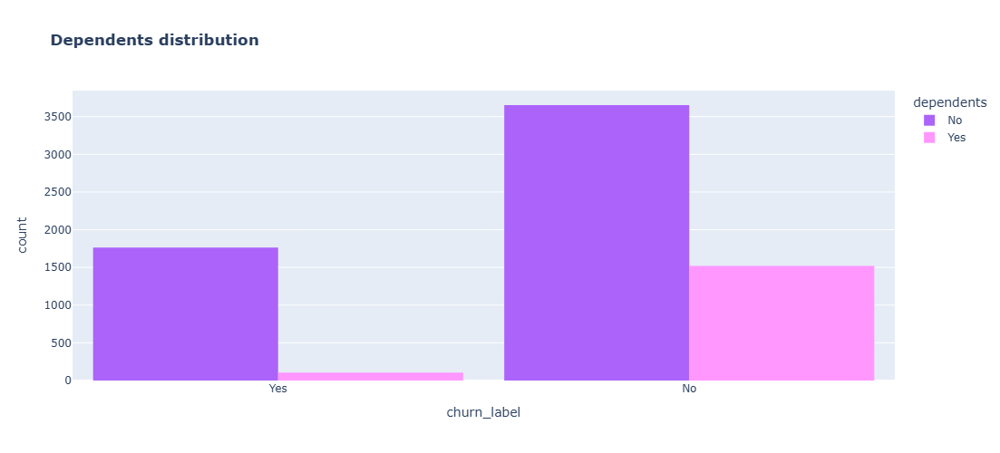

In [31]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(df, x="churn_label", color="dependents", barmode="group", 
                   title="<b>Dependents distribution</b>", color_discrete_map=color_map)

fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

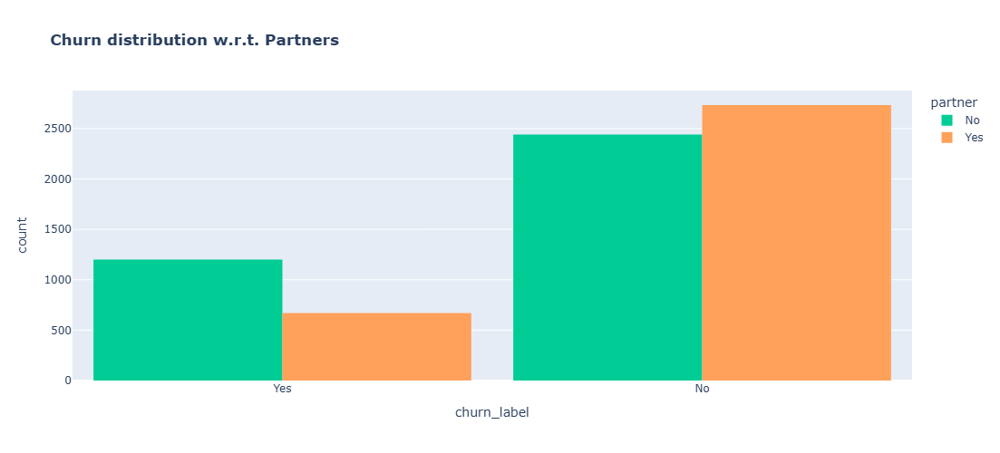

In [33]:
color_map = {"Yes": '#FFA15A', "No": '#00CC96'}
fig = px.histogram(df, x="churn_label", color="partner", 
                   barmode="group", 
                   title="<b>Churn distribution w.r.t. Partners</b>", 
                   color_discrete_map=color_map)

fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

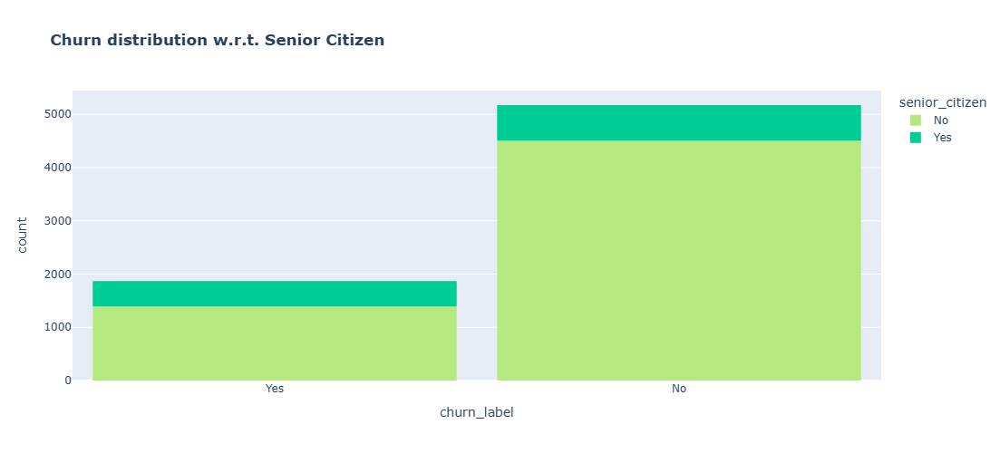

In [35]:
color_map = {"Yes": '#00CC96', "No": '#B6E880'}
fig = px.histogram(df, x="churn_label", color="senior_citizen", 
                   title="<b>Churn distribution w.r.t. Senior Citizen</b>", 
                   color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()


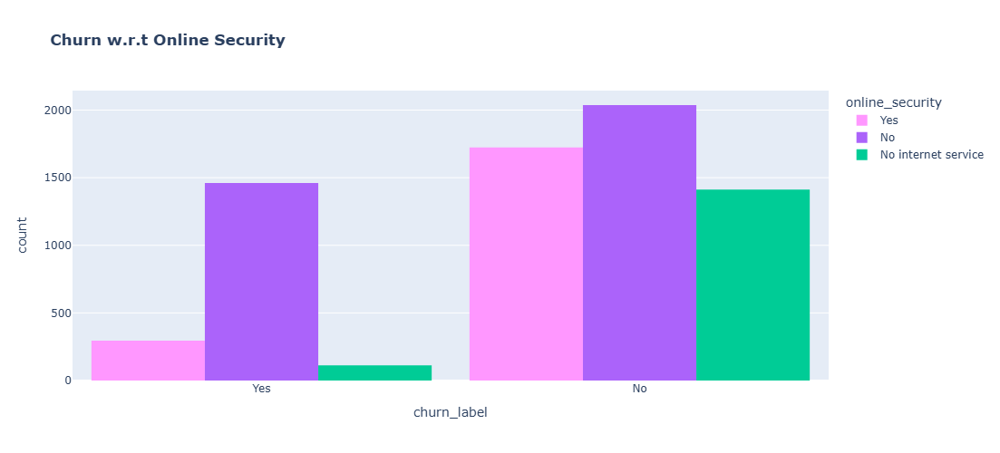

In [37]:
color_map = {"Yes": "#FF97FF", "No": "#AB63FA"}
fig = px.histogram(df, x="churn_label", color="online_security", barmode="group", title="<b>Churn w.r.t Online Security</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

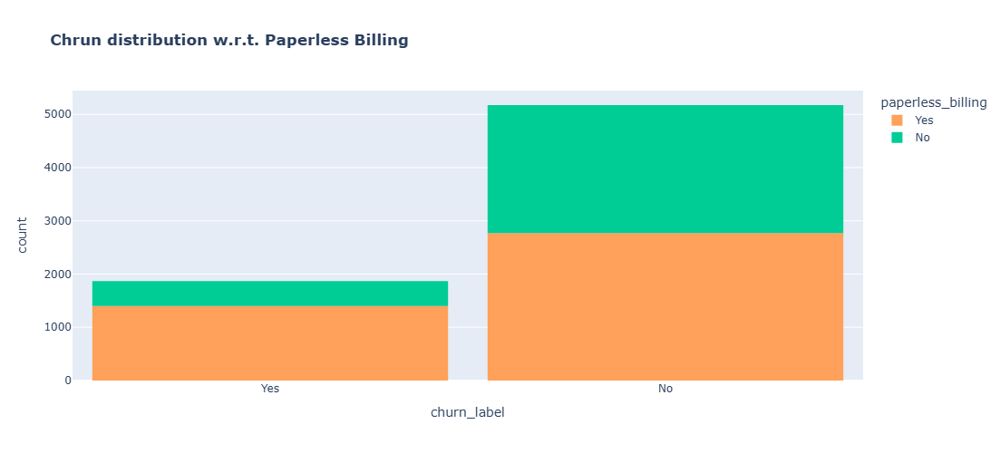

In [39]:
color_map = {"Yes": '#FFA15A', "No": '#00CC96'}
fig = px.histogram(df, x="churn_label", color="paperless_billing",  title="<b>Chrun distribution w.r.t. Paperless Billing</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

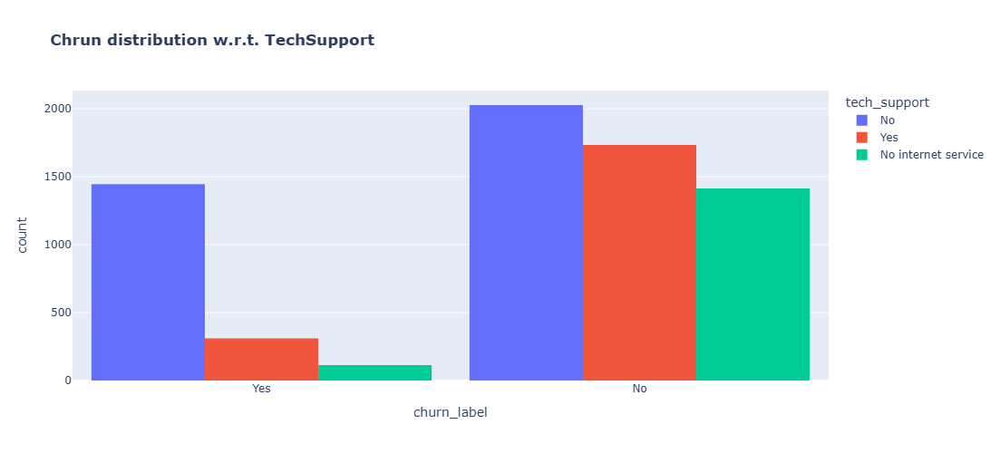

In [41]:
fig = px.histogram(df, x="churn_label", color="tech_support",barmode="group",  title="<b>Chrun distribution w.r.t. TechSupport</b>")
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

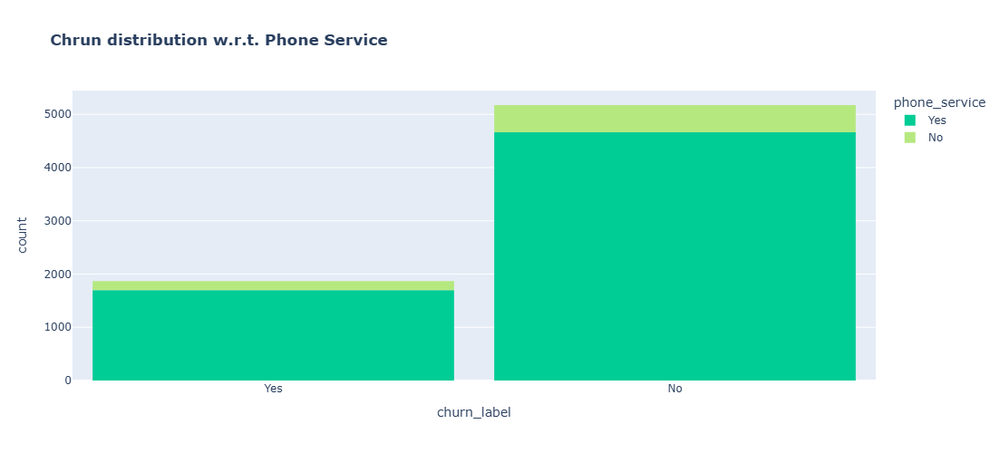

In [43]:
color_map = {"Yes": '#00CC96', "No": '#B6E880'}
fig = px.histogram(df, x="churn_label", color="phone_service", title="<b>Chrun distribution w.r.t. Phone Service</b>", color_discrete_map=color_map)
fig.update_layout(width=700, height=500, bargap=0.1)
fig.show()

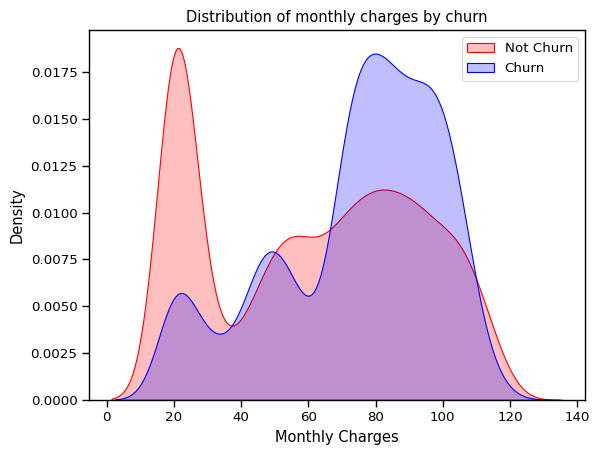

In [45]:
sns.set_context("paper",font_scale=1.1)
ax = sns.kdeplot(df.monthly_charges[(df["churn_label"] == 'No') ],
                color="Red", fill = True);
ax = sns.kdeplot(df.monthly_charges[(df["churn_label"] == 'Yes') ],
                ax =ax, color="Blue", fill= True);
ax.legend(["Not Churn","Churn"],loc='upper right');
ax.set_ylabel('Density');
ax.set_xlabel('Monthly Charges');
ax.set_title('Distribution of monthly charges by churn');

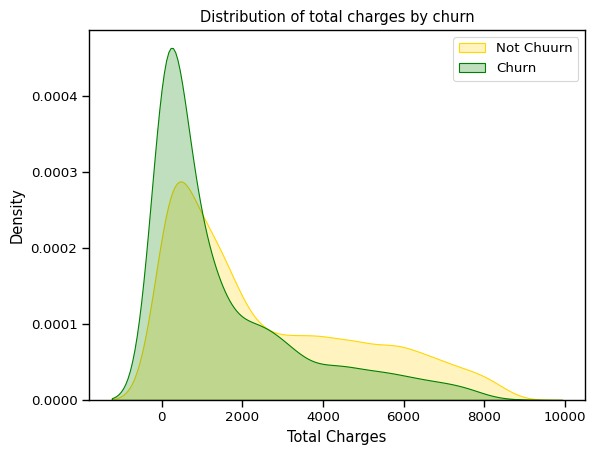

In [47]:
df["total_charges"] = pd.to_numeric(df["total_charges"], errors="coerce")
ax = sns.kdeplot(df.total_charges[(df["churn_label"] == 'No') ],
                color="Gold", fill = True);
ax = sns.kdeplot(df.total_charges[(df["churn_label"] == 'Yes') ],
                ax =ax, color="Green", fill= True);
ax.legend(["Not Chuurn","Churn"],loc='upper right');
ax.set_ylabel('Density');
ax.set_xlabel('Total Charges');
ax.set_title('Distribution of total charges by churn');

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Identify numerical and categorical features
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
categorical_features = df.select_dtypes(include=['object', 'category']).columns

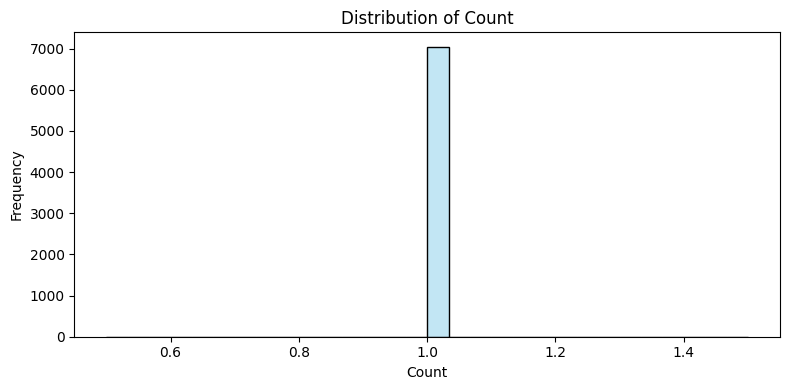

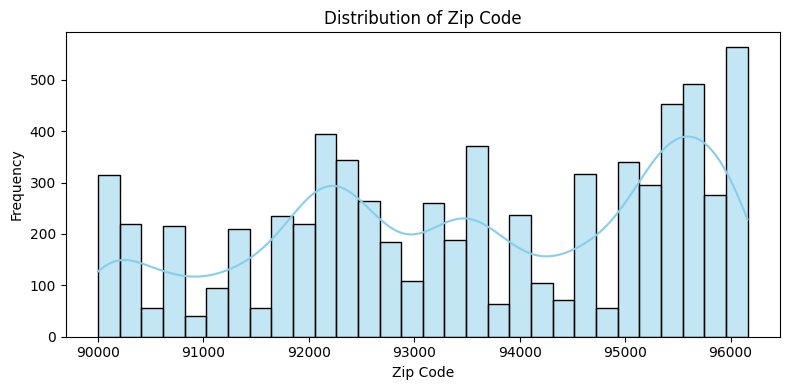

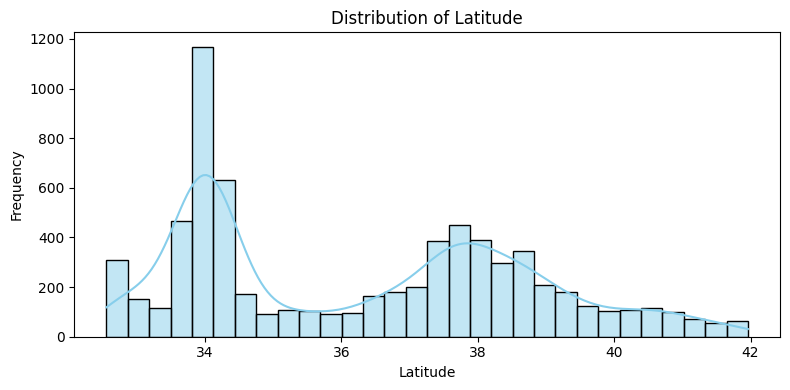

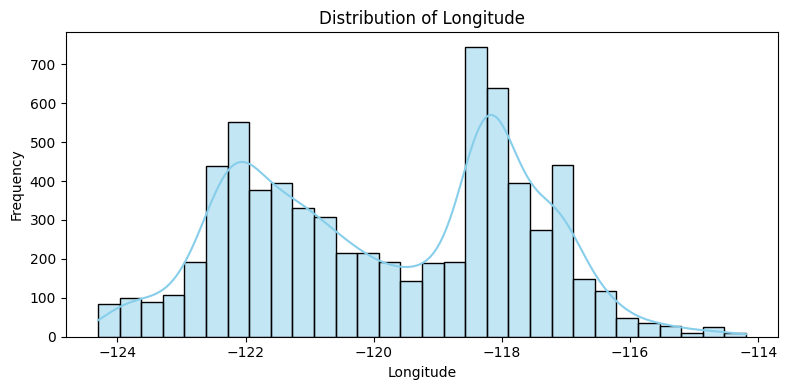

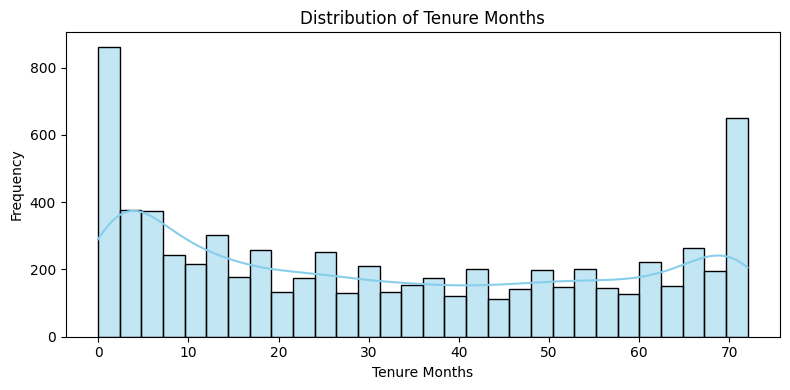

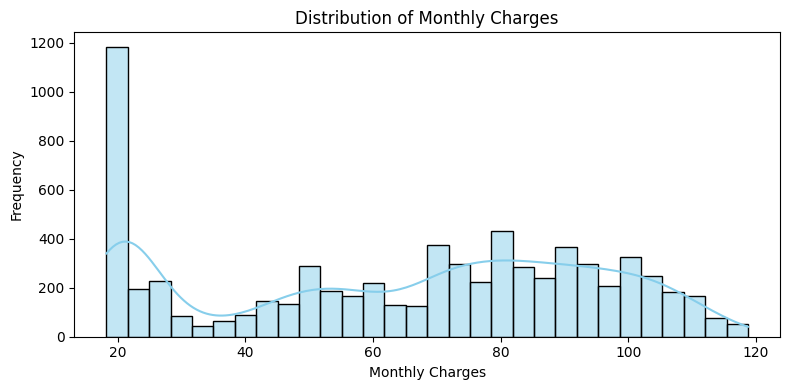

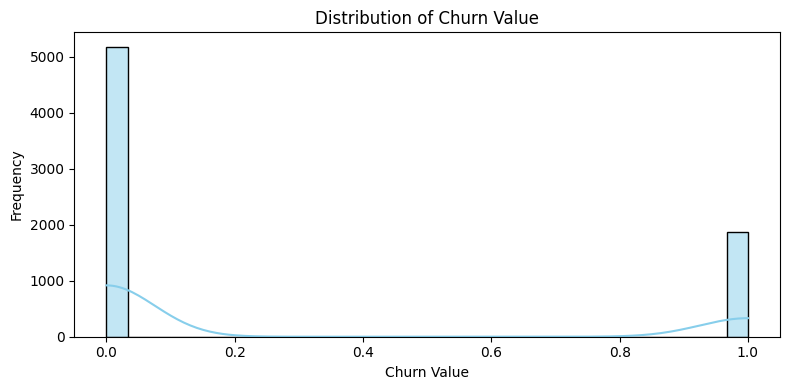

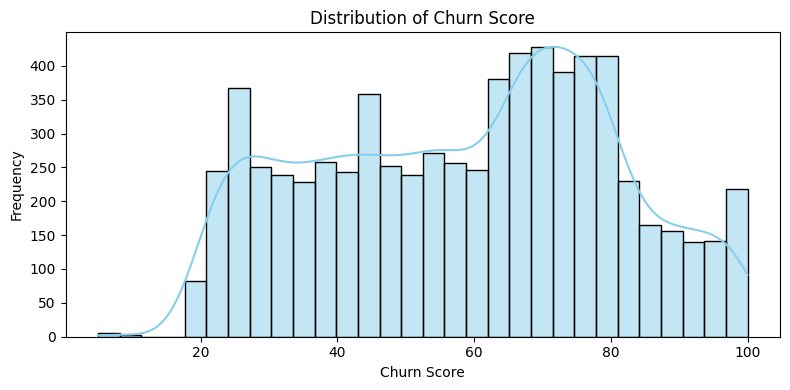

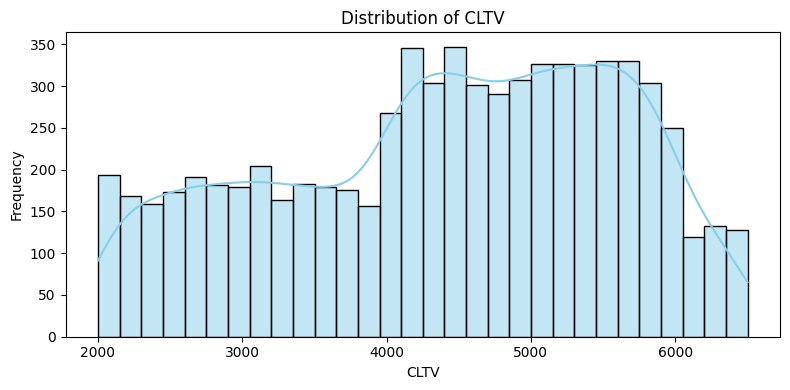

In [18]:
for feature in numerical_features:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[feature], bins=30, kde=True, color='skyblue')
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


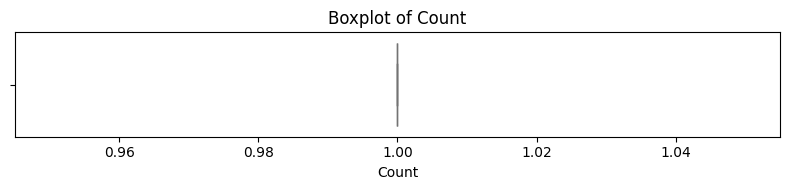

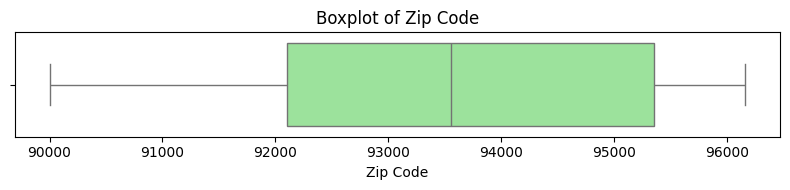

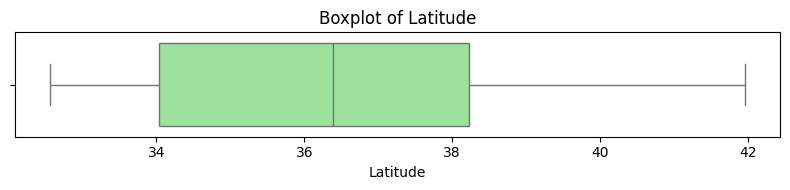

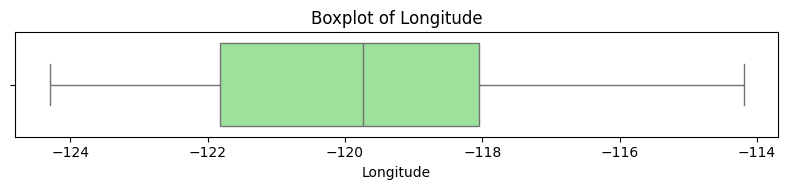

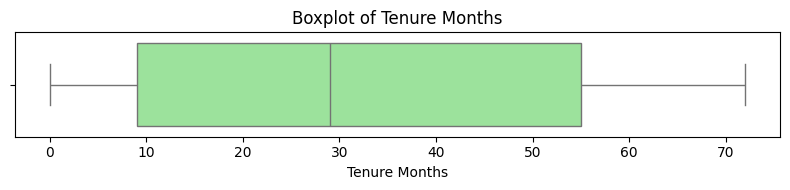

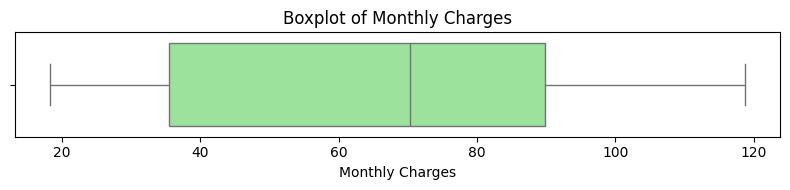

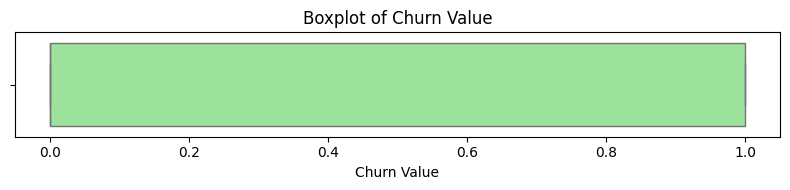

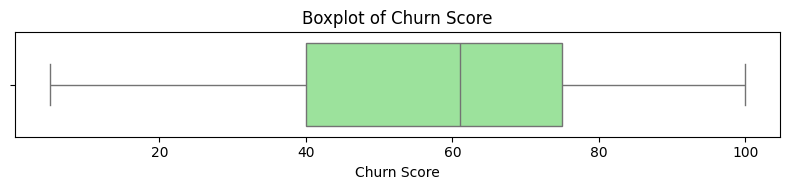

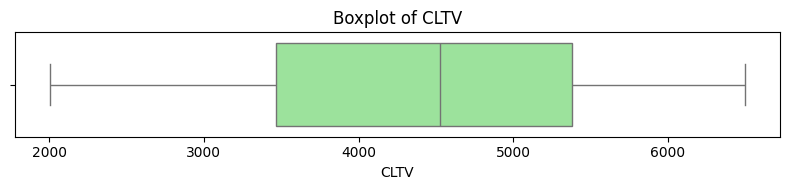

In [20]:
for feature in numerical_features:
    plt.figure(figsize=(8, 2))
    sns.boxplot(x=df[feature], color='lightgreen')
    plt.title(f'Boxplot of {feature}')
    plt.xlabel(feature)
    plt.tight_layout()
    plt.show()


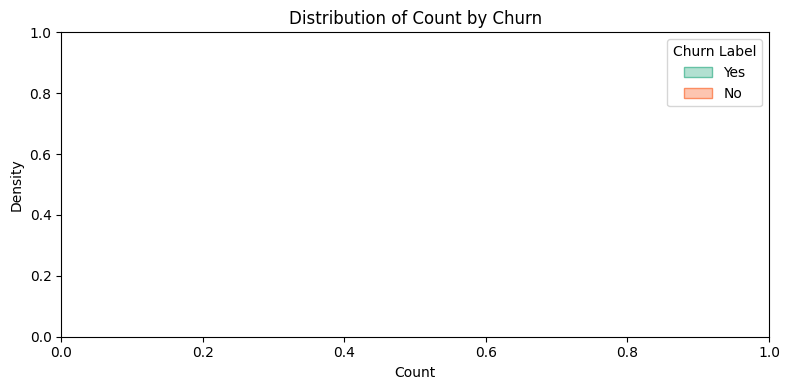

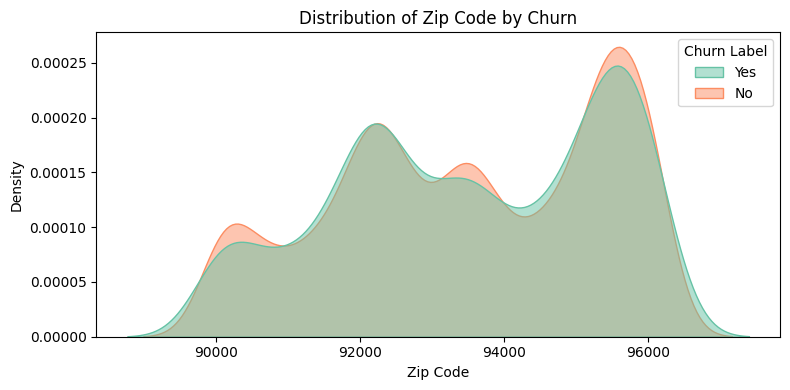

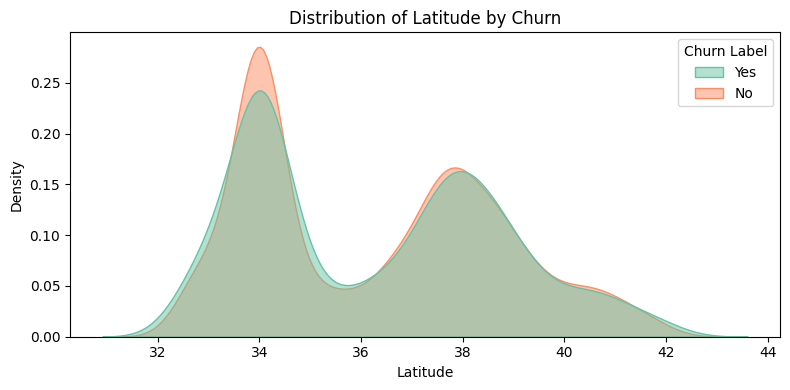

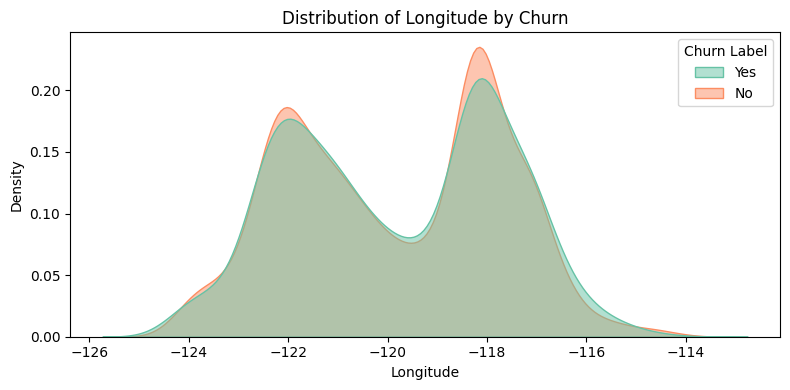

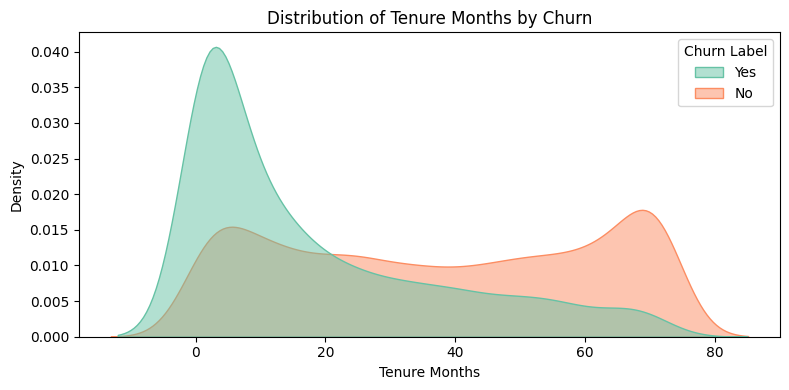

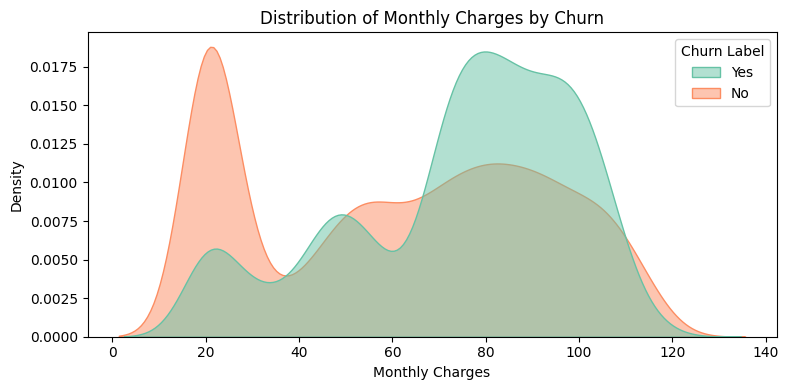

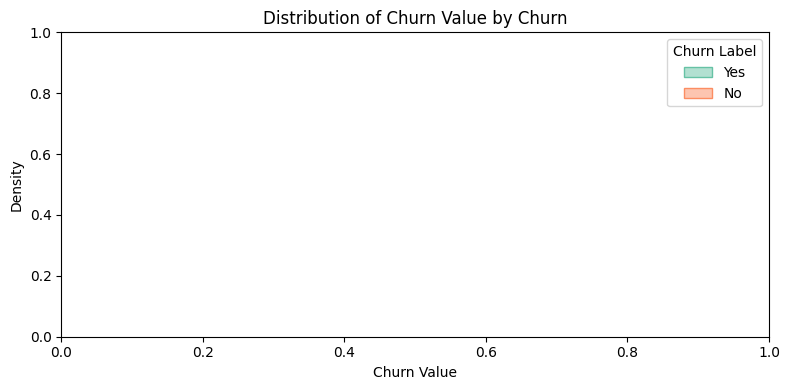

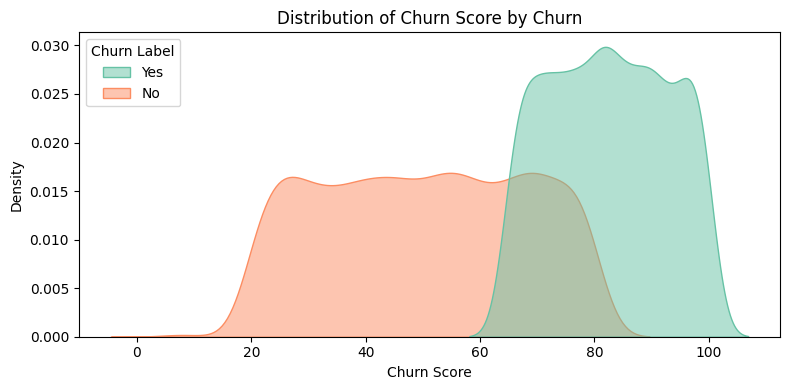

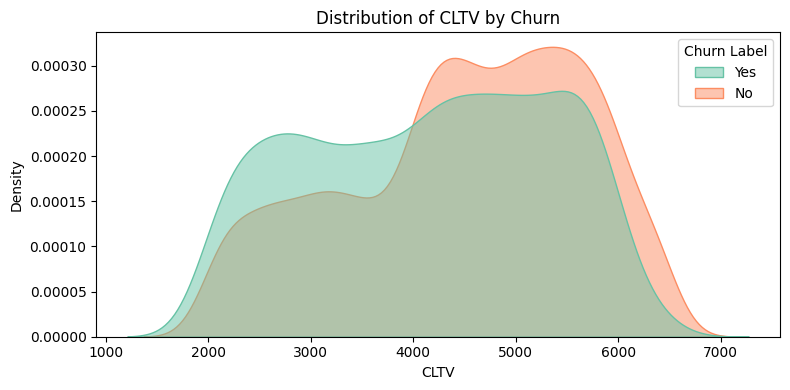

In [16]:
for feature in numerical_features:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=df, x=feature, hue='Churn Label', fill=True, common_norm=False, palette='Set2', alpha=0.5,warn_singular=False)
    plt.title(f'Distribution of {feature} by Churn')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.tight_layout()
    plt.show()


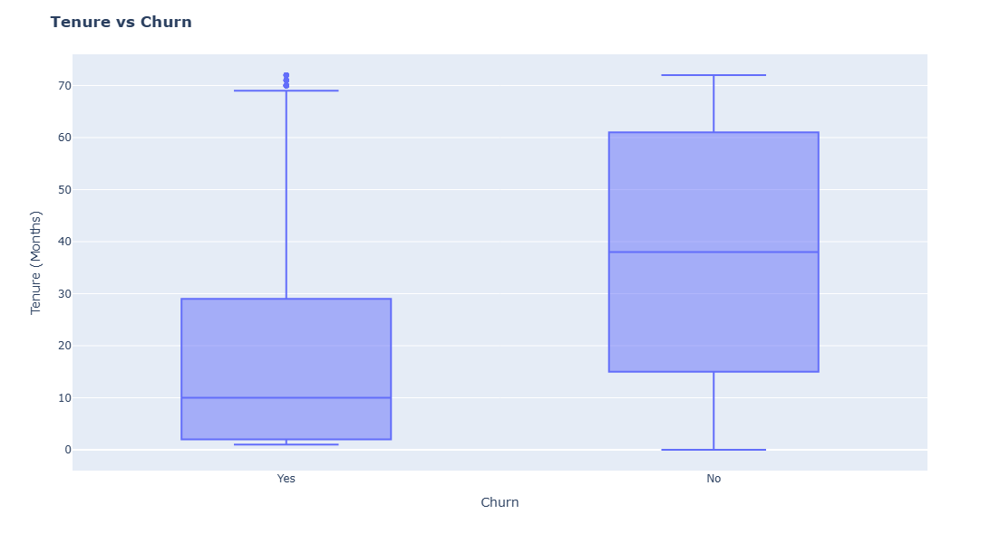

In [49]:
fig = px.box(df, x='churn_label', y = 'tenure_months')

# Update yaxis properties
fig.update_yaxes(title_text='Tenure (Months)', row=1, col=1)
# Update xaxis properties
fig.update_xaxes(title_text='Churn', row=1, col=1)

# Update size and title
fig.update_layout(autosize=True, width=750, height=600,
    title_font=dict(size=25, family='Courier'),
    title='<b>Tenure vs Churn</b>',
)

fig.show()

In [51]:
#Create a label encoder object
le = LabelEncoder()
# Label Encoding will be used for columns with 2 or less unique
values
le_count = 0
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            le.fit(df[col])
            df[col] = le.transform(df[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))



9 columns were label encoded.


In [53]:
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')
print(df.columns.tolist())


['customerid', 'count', 'country', 'state', 'city', 'zip_code', 'lat_long', 'latitude', 'longitude', 'gender', 'senior_citizen', 'partner', 'dependents', 'tenure_months', 'phone_service', 'multiple_lines', 'internet_service', 'online_security', 'online_backup', 'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies', 'contract', 'paperless_billing', 'payment_method', 'monthly_charges', 'total_charges', 'churn_label', 'churn_value', 'churn_score', 'cltv', 'churn_reason']


Text(0.5, 1.0, 'Correlation with Churn Rate \n')

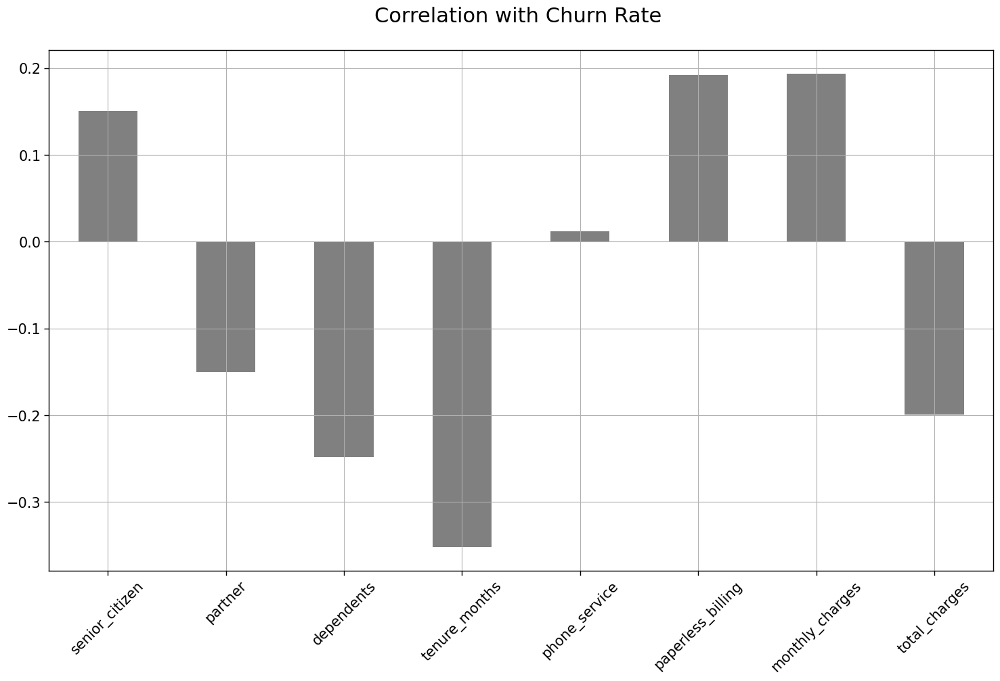

In [55]:
df2 = df[['senior_citizen', 'partner', 'dependents',
            'tenure_months', 'phone_service', 'paperless_billing',
            'monthly_charges', 'total_charges']]


correlations = df2.corrwith(df.churn_label)
correlations = correlations[correlations!=1]
positive_correlations = correlations[correlations >0].sort_values(ascending = False)
negative_correlations =correlations[correlations<0].sort_values(ascending = False)

correlations.plot.bar(
        figsize = (18, 10),
        fontsize = 15,
        color = 'grey',
        rot = 45, grid = True)
plt.title('Correlation with Churn Rate \n',
horizontalalignment="center", fontstyle = "normal",
fontsize = "22", fontfamily = "sans-serif")

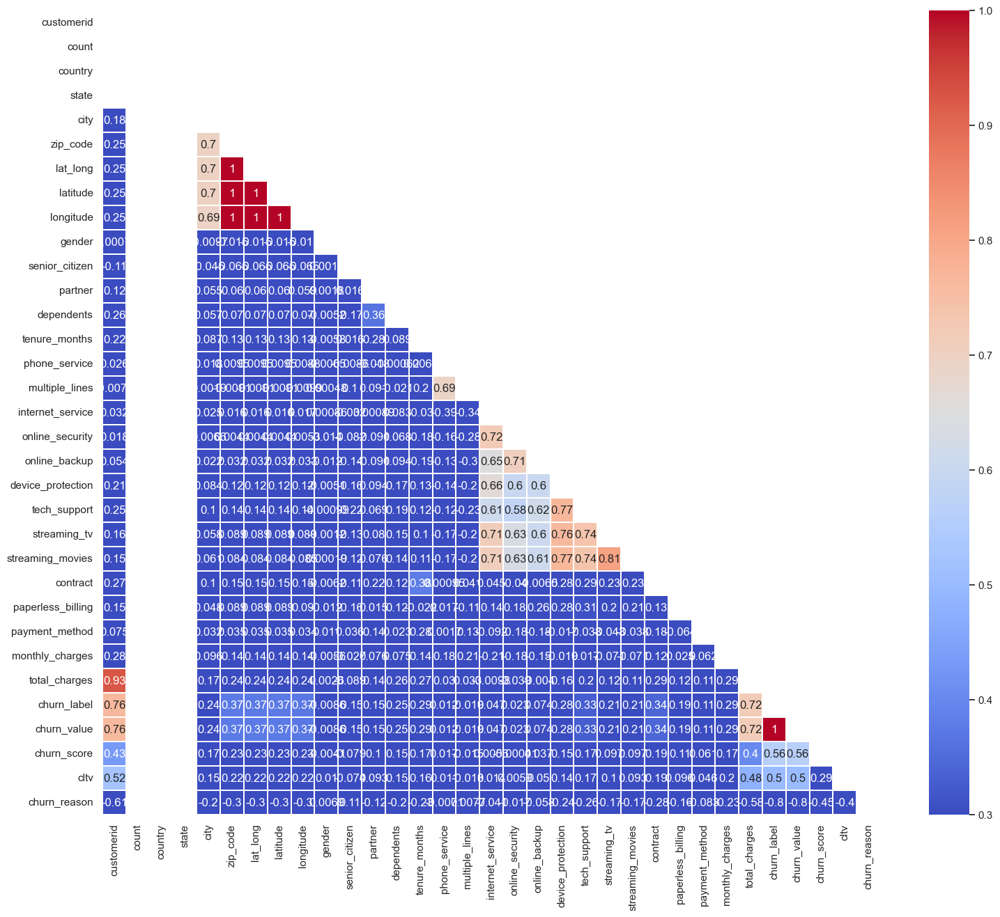

In [57]:
#Set and compute the Correlation Matrix:
sns.set(style="white")
plt.figure(figsize=(18, 15))

corr = df.apply(lambda x: pd.factorize(x)[0]).corr()

mask = np.triu(np.ones_like(corr, dtype=bool))

ax = sns.heatmap(corr, mask=mask, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, linewidths=.2, cmap='coolwarm', vmin=0.3, vmax=1)

<Axes: >

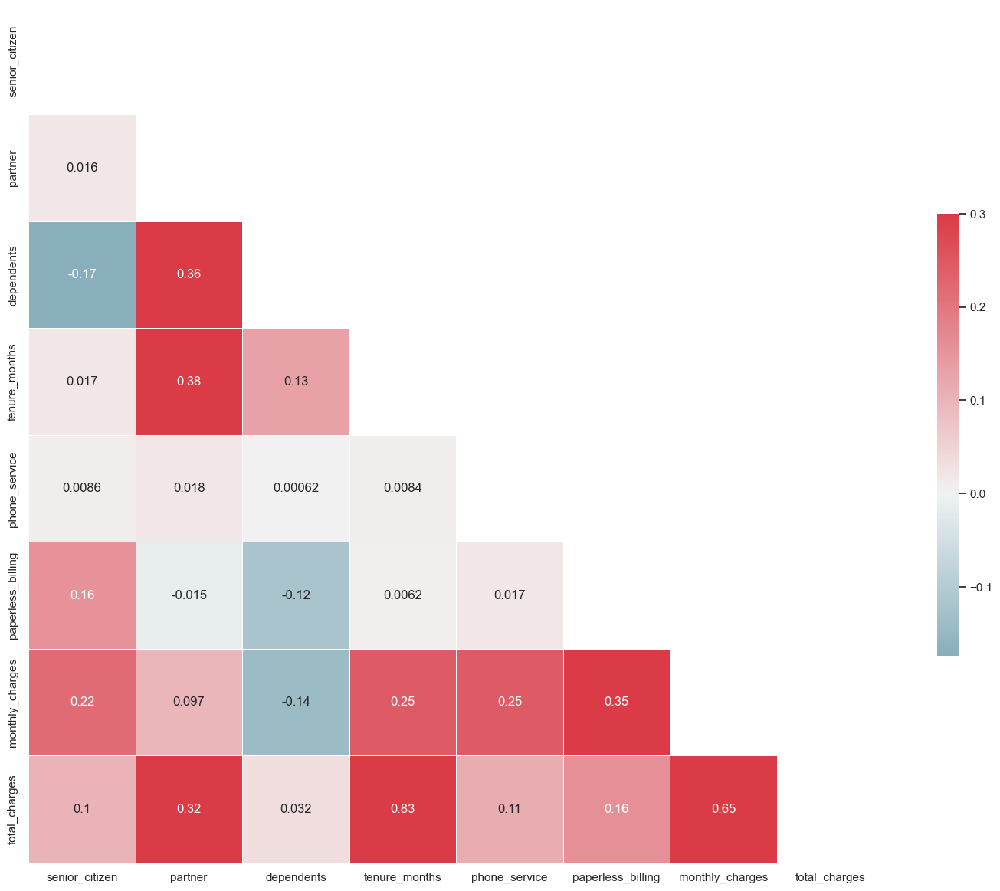

In [59]:
#Set and compute the Correlation Matrix:
sns.set(style="white")
corr = df2.corr()

#Generate a mask for the upper triangle:

mask = np.zeros_like(corr, dtype=np.bool_)

mask[np.triu_indices_from(mask)] = True

#Set up the matplotlib figure and a diverging colormap:
f, ax = plt.subplots(figsize=(18, 15))
cmap = sns.diverging_palette(220, 10, as_cmap=True)

#Draw the heatmap with the mask and correct aspect ratio:
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,square=True,annot = True, linewidths=.5, cbar_kws={"shrink": .5})

## 🌲 Gradient Boosting Model

In [34]:

from sklearn.ensemble import GradientBoostingClassifier

gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train_scaled, y_train)
gb_preds_proba = gb_model.predict_proba(X_test_scaled)[:, 1]


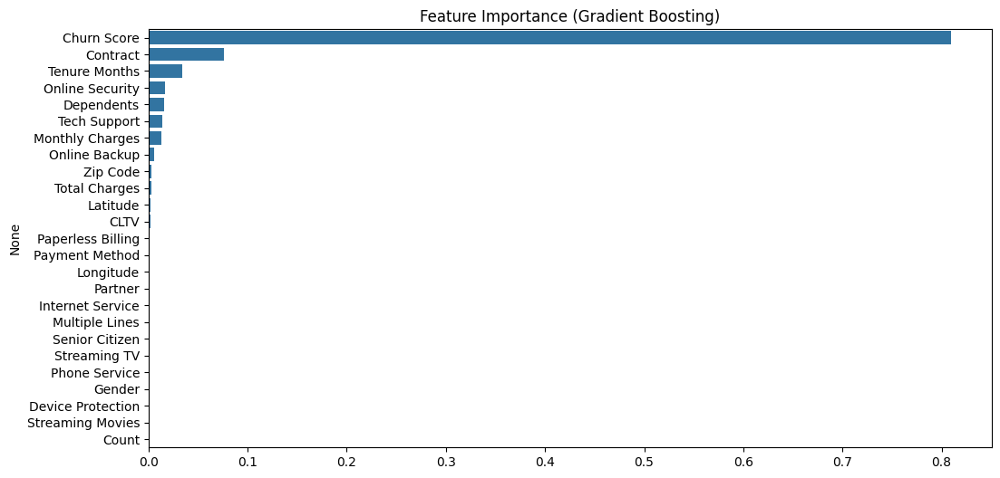

C:\Users\HP\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but GradientBoostingClassifier was fitted without feature names
  warnings.warn(


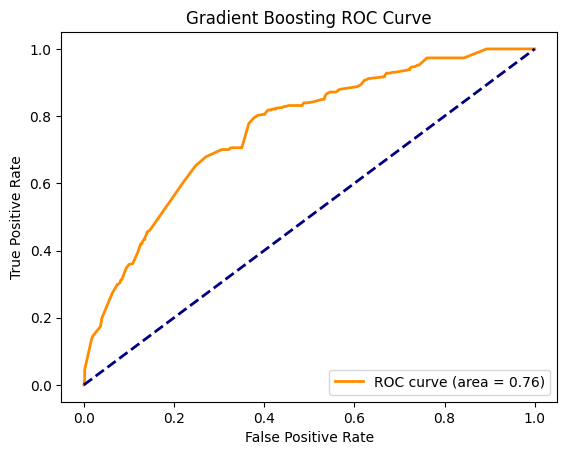

In [36]:
# Feature Importance from Gradient Boosting
importances = gb_model.feature_importances_
indices = importances.argsort()[::-1]
features = X_train.columns

plt.figure(figsize=(12,6))
sns.barplot(x=importances[indices], y=features[indices])
plt.title('Feature Importance (Gradient Boosting)')
plt.show()

# ROC Curve for Gradient Boosting
from sklearn.metrics import roc_curve, auc

y_pred_probs = gb_model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.title('Gradient Boosting ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc="lower right")
plt.show()


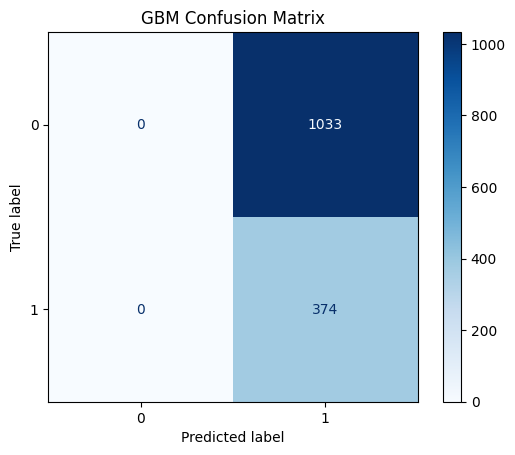

In [42]:
# Convert predicted probabilities to predicted labels
y_pred_labels = (y_pred_probs >= 0.5).astype(int)

# Compute confusion matrix
cm = confusion_matrix(y_test, y_pred_labels)

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title("GBM Confusion Matrix")
plt.show()


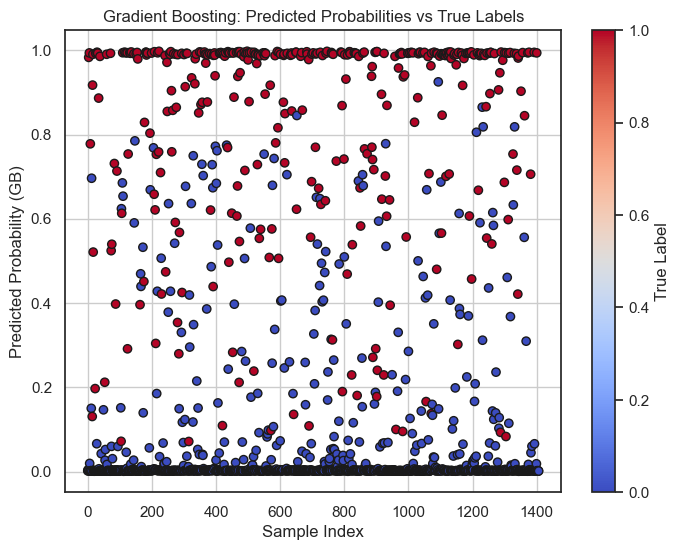

In [111]:
plt.figure(figsize=(8,6))
plt.scatter(range(len(y_test)), gb_preds_proba, c=y_test, cmap='coolwarm', edgecolor='k')
plt.title('Gradient Boosting: Predicted Probabilities vs True Labels')
plt.xlabel('Sample Index')
plt.ylabel('Predicted Probability (GB)')
plt.colorbar(label='True Label')
plt.grid(True)
plt.show()


## 🔁 LSTM Model

In [87]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from tensorflow.keras.utils import to_categorical

# Reshape for LSTM input
X_train_lstm = np.reshape(X_train_scaled, (X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
X_test_lstm = np.reshape(X_test_scaled, (X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

# One-hot encode target
y_train_lstm = to_categorical(y_train)
y_test_lstm = to_categorical(y_test)

# Build LSTM model
lstm_model = Sequential([
    LSTM(64, input_shape=(1, X_train_scaled.shape[1]), return_sequences=False),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dense(2, activation='softmax')
])
lstm_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history=lstm_model.fit(X_train_lstm, y_train_lstm, epochs=10, batch_size=64, validation_split=0.2,verbose=1)

# Predict with LSTM
lstm_preds_proba = lstm_model.predict(X_test_lstm)[:, 1]


Epoch 1/10


C:\Users\HP\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



71/71 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.7471 - loss: 0.5786 - val_accuracy: 0.8871 - val_loss: 0.3105
Epoch 2/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.8872 - loss: 0.2909 - val_accuracy: 0.9253 - val_loss: 0.1951
Epoch 3/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9061 - loss: 0.2086 - val_accuracy: 0.9298 - val_loss: 0.1727
Epoch 4/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9176 - loss: 0.1900 - val_accuracy: 0.9236 - val_loss: 0.1660
Epoch 5/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9212 - loss: 0.1825 - val_accuracy: 0.9236 - val_loss: 0.1650
Epoch 6/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9209 - loss: 0.1798 - val_accuracy: 0.9271 - val_loss: 0.1608
Epoch 7/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9242 - loss: 0.1720 - val_accuracy: 0.9244 - val_loss: 0.1598
Epoch 8/10
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9264 - loss: 0.1788 - val_accuracy: 0.9289 - val_loss: 0.1584
Ep

In [85]:
print(history.history.keys())


dict_keys(['accuracy', 'loss'])


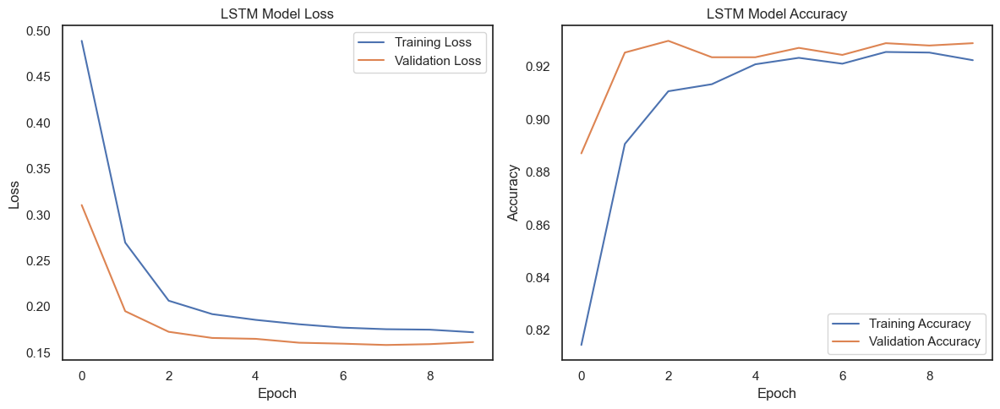

In [91]:
# Plotting Training and Validation Loss
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plotting Training and Validation Accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('LSTM Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()



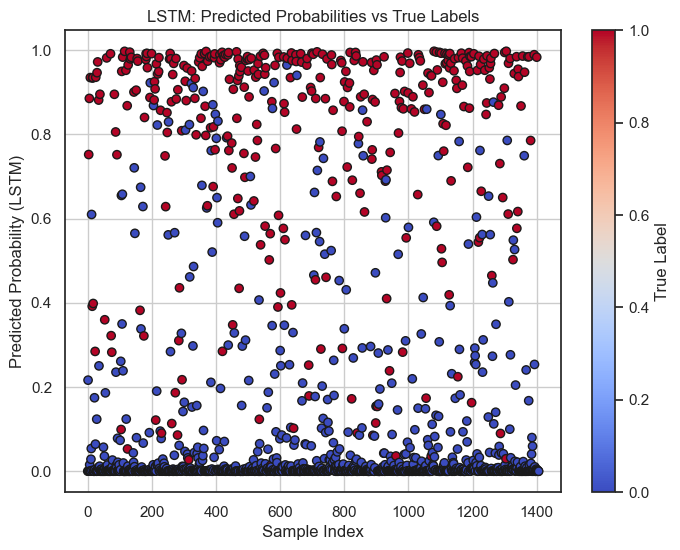

In [113]:
plt.figure(figsize=(8,6))
plt.scatter(range(len(y_test)), lstm_preds_proba, c=y_test, cmap='coolwarm', edgecolor='k')
plt.title('LSTM: Predicted Probabilities vs True Labels')
plt.xlabel('Sample Index')
plt.ylabel('Predicted Probability (LSTM)')
plt.colorbar(label='True Label')
plt.grid(True)
plt.show()


## 🔗 Hybrid Model (Meta Learner)

In [93]:

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Combine predictions
combined_preds = np.column_stack((gb_preds_proba, lstm_preds_proba))

# Train meta-learner
meta_model = LogisticRegression()
meta_model.fit(combined_preds, y_test)

# Evaluate
hybrid_preds = meta_model.predict(combined_preds)
accuracy = accuracy_score(y_test, hybrid_preds)
print("Hybrid Model Accuracy:", accuracy)
print(classification_report(y_test, hybrid_preds))


Hybrid Model Accuracy: 0.9253731343283582
              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1033
           1       0.86      0.85      0.86       374

    accuracy                           0.93      1407
   macro avg       0.91      0.90      0.90      1407
weighted avg       0.93      0.93      0.93      1407



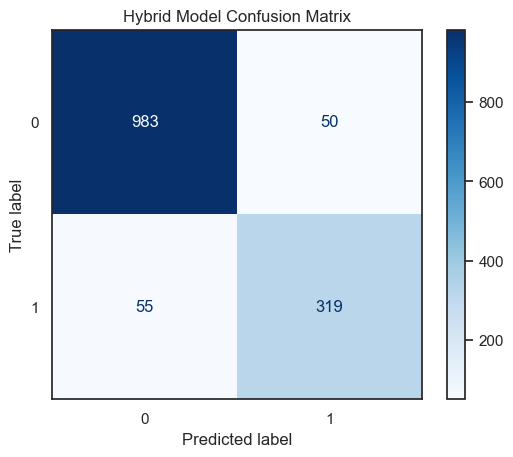

In [99]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute confusion matrix
cm = confusion_matrix(y_test, hybrid_preds)

# Plot
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues')
plt.title('Hybrid Model Confusion Matrix')
plt.show()


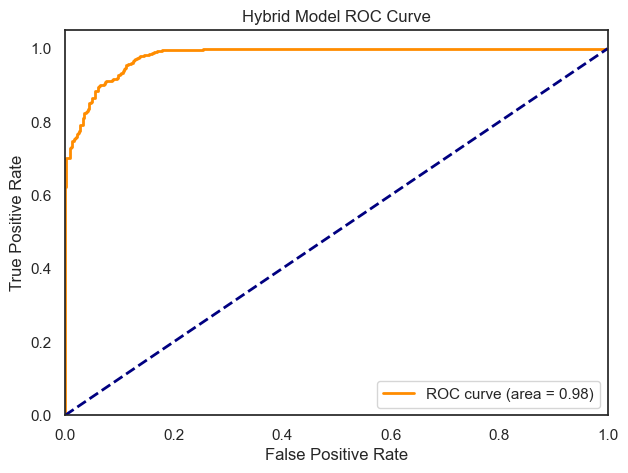

In [101]:
from sklearn.metrics import roc_curve, auc

# Get probabilities for positive class
hybrid_probs = meta_model.predict_proba(combined_preds)[:, 1]

# Compute ROC
fpr, tpr, thresholds = roc_curve(y_test, hybrid_probs)
roc_auc = auc(fpr, tpr)

# Plot
plt.figure(figsize=(7, 5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Hybrid Model ROC Curve')
plt.legend(loc="lower right")
plt.show()


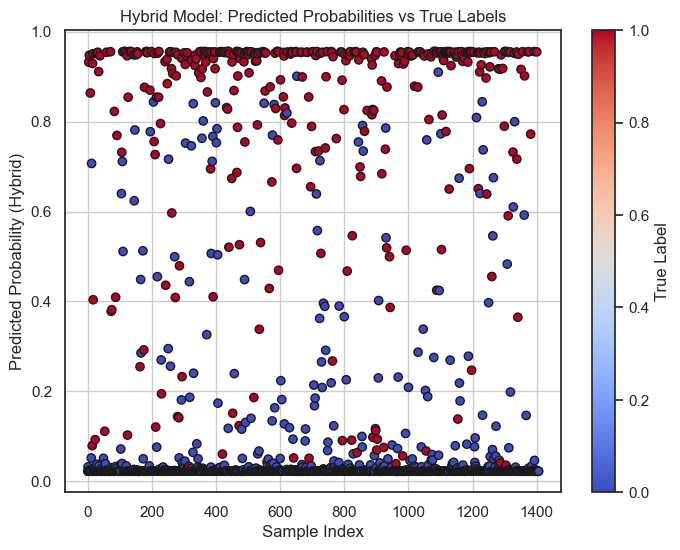

In [117]:
plt.figure(figsize=(8,6))
plt.scatter(range(len(y_test)), hybrid_probs, c=y_test, cmap='coolwarm', edgecolor='k')
plt.title('Hybrid Model: Predicted Probabilities vs True Labels')
plt.xlabel('Sample Index')
plt.ylabel('Predicted Probability (Hybrid)')
plt.colorbar(label='True Label')
plt.grid(True)
plt.show()


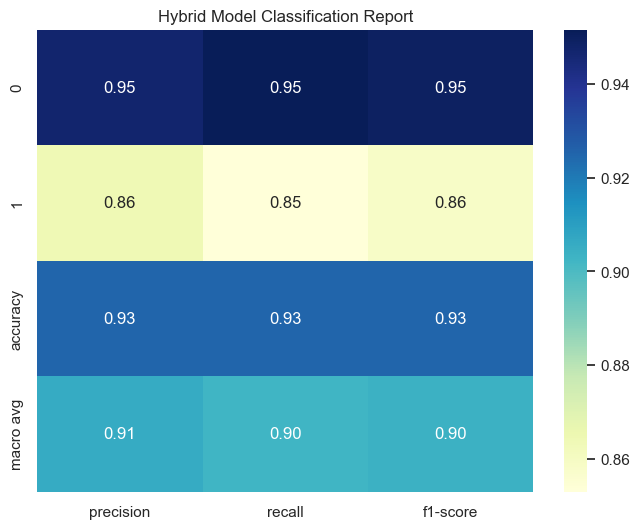

In [103]:
import seaborn as sns
import pandas as pd
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_test, hybrid_preds, output_dict=True)
report_df = pd.DataFrame(report).transpose()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap='YlGnBu', fmt='.2f')
plt.title('Hybrid Model Classification Report')
plt.show()


## 🚀 Decision Boundary for Hybrid Model

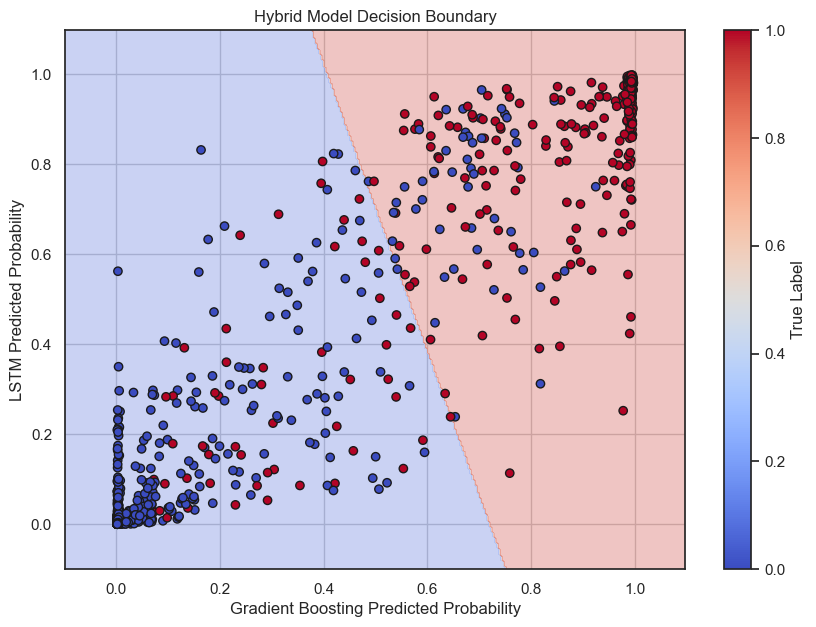

In [105]:
# Because hybrid model input (the combined_preds) is 2D (Gradient Boosting probs and LSTM probs), we can directly plot the decision surface without needing PCA.
import numpy as np
import matplotlib.pyplot as plt

# Create a mesh grid
x_min, x_max = combined_preds[:, 0].min() - 0.1, combined_preds[:, 0].max() + 0.1
y_min, y_max = combined_preds[:, 1].min() - 0.1, combined_preds[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300),
                     np.linspace(y_min, y_max, 300))

# Predict over the grid
grid = np.c_[xx.ravel(), yy.ravel()]
Z = meta_model.predict(grid)
Z = Z.reshape(xx.shape)

# Plot
plt.figure(figsize=(10, 7))
plt.contourf(xx, yy, Z, alpha=0.3, cmap='coolwarm')

# Scatter the real data points
scatter = plt.scatter(combined_preds[:, 0], combined_preds[:, 1], c=y_test, cmap='coolwarm', edgecolor='k')
plt.title('Hybrid Model Decision Boundary')
plt.xlabel('Gradient Boosting Predicted Probability')
plt.ylabel('LSTM Predicted Probability')
plt.colorbar(scatter, label='True Label')
plt.grid(True)
plt.show()


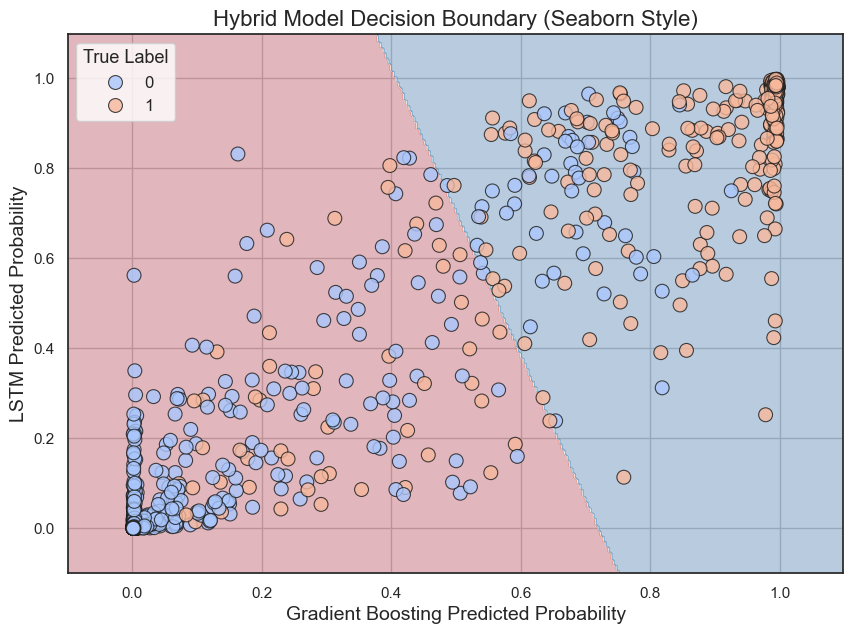

In [109]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Create the mesh grid for background
x_min, x_max = combined_preds[:, 0].min() - 0.1, combined_preds[:, 0].max() + 0.1
y_min, y_max = combined_preds[:, 1].min() - 0.1, combined_preds[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 300),
                     np.linspace(y_min, y_max, 300))

# Predict over the grid
grid = np.c_[xx.ravel(), yy.ravel()]
Z = meta_model.predict(grid)
Z = Z.reshape(xx.shape)

# Plot
plt.figure(figsize=(10,7))
# Background decision boundary
plt.contourf(xx, yy, Z, alpha=0.3, cmap='RdBu')

# Real data points
sns.scatterplot(x=combined_preds[:, 0],
                y=combined_preds[:, 1],
                hue=y_test,
                palette='coolwarm',
                edgecolor='k',
                alpha=0.8,
                s=100)

plt.title('Hybrid Model Decision Boundary (Seaborn Style)', fontsize=16)
plt.xlabel('Gradient Boosting Predicted Probability', fontsize=14)
plt.ylabel('LSTM Predicted Probability', fontsize=14)
plt.legend(title='True Label', fontsize=12, title_fontsize=13)
plt.grid(True)
plt.show()


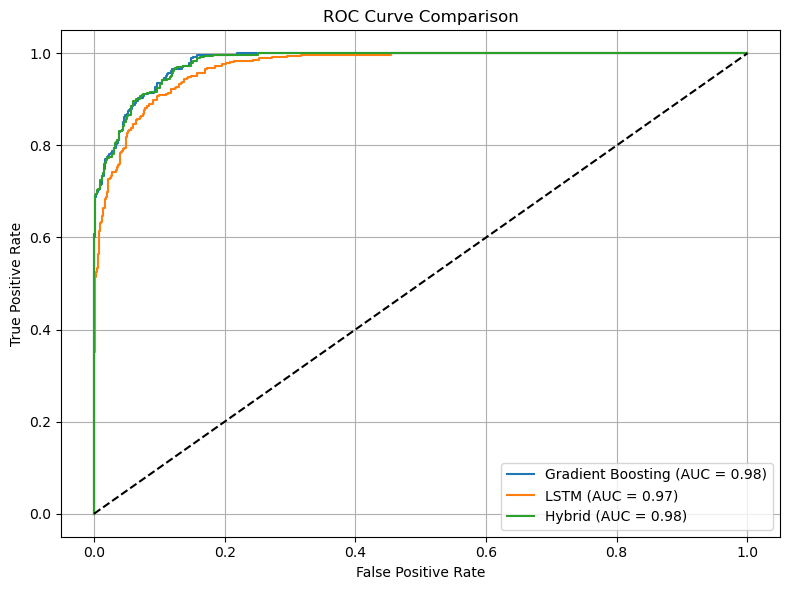

In [29]:
# 📉 ROC Curve for All Models
from sklearn.metrics import roc_curve, auc

fpr_gb, tpr_gb, _ = roc_curve(y_test, gb_preds_proba)
fpr_lstm, tpr_lstm, _ = roc_curve(y_test, lstm_preds_proba)
fpr_hybrid, tpr_hybrid, _ = roc_curve(y_test, meta_model.predict_proba(combined_preds)[:, 1])

auc_gb = auc(fpr_gb, tpr_gb)
auc_lstm = auc(fpr_lstm, tpr_lstm)
auc_hybrid = auc(fpr_hybrid, tpr_hybrid)

plt.figure(figsize=(8, 6))
plt.plot(fpr_gb, tpr_gb, label=f'Gradient Boosting (AUC = {auc_gb:.2f})')
plt.plot(fpr_lstm, tpr_lstm, label=f'LSTM (AUC = {auc_lstm:.2f})')
plt.plot(fpr_hybrid, tpr_hybrid, label=f'Hybrid (AUC = {auc_hybrid:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.title('ROC Curve Comparison')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()


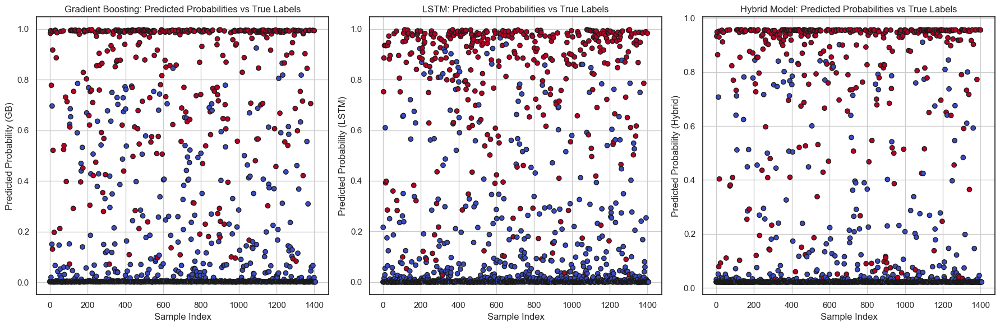

In [119]:
import matplotlib.pyplot as plt

# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Gradient Boosting Model Plot
axes[0].scatter(range(len(y_test)), gb_preds_proba, c=y_test, cmap='coolwarm', edgecolor='k')
axes[0].set_title('Gradient Boosting: Predicted Probabilities vs True Labels')
axes[0].set_xlabel('Sample Index')
axes[0].set_ylabel('Predicted Probability (GB)')
axes[0].grid(True)

# LSTM Model Plot
axes[1].scatter(range(len(y_test)), lstm_preds_proba, c=y_test, cmap='coolwarm', edgecolor='k')
axes[1].set_title('LSTM: Predicted Probabilities vs True Labels')
axes[1].set_xlabel('Sample Index')
axes[1].set_ylabel('Predicted Probability (LSTM)')
axes[1].grid(True)

# Hybrid Model Plot
axes[2].scatter(range(len(y_test)), hybrid_probs, c=y_test, cmap='coolwarm', edgecolor='k')
axes[2].set_title('Hybrid Model: Predicted Probabilities vs True Labels')
axes[2].set_xlabel('Sample Index')
axes[2].set_ylabel('Predicted Probability (Hybrid)')
axes[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()
